In [1]:
import pickle
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from evaluation_util import plot, evaluate_on_dataset, perf_df

sc.set_figure_params(dpi=100, frameon=False, facecolor=None)

Global seed set to 0
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.


ryp2 is not installed. Install with pip install rpy2 to run tools with R support.

To use sccoda or tasccoda please install ete3 with pip install ete3

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
dss_path = '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93zoj'

In [4]:
performances = {}

## garcia

In [251]:
%%time
with open(f'{dss_path}/garcia_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 78.6 ms, sys: 186 ms, total: 265 ms
Wall time: 262 ms


In [252]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['pcw'] = [float(p) if 'control' not in p else 8.6 for p in df.perturbation]

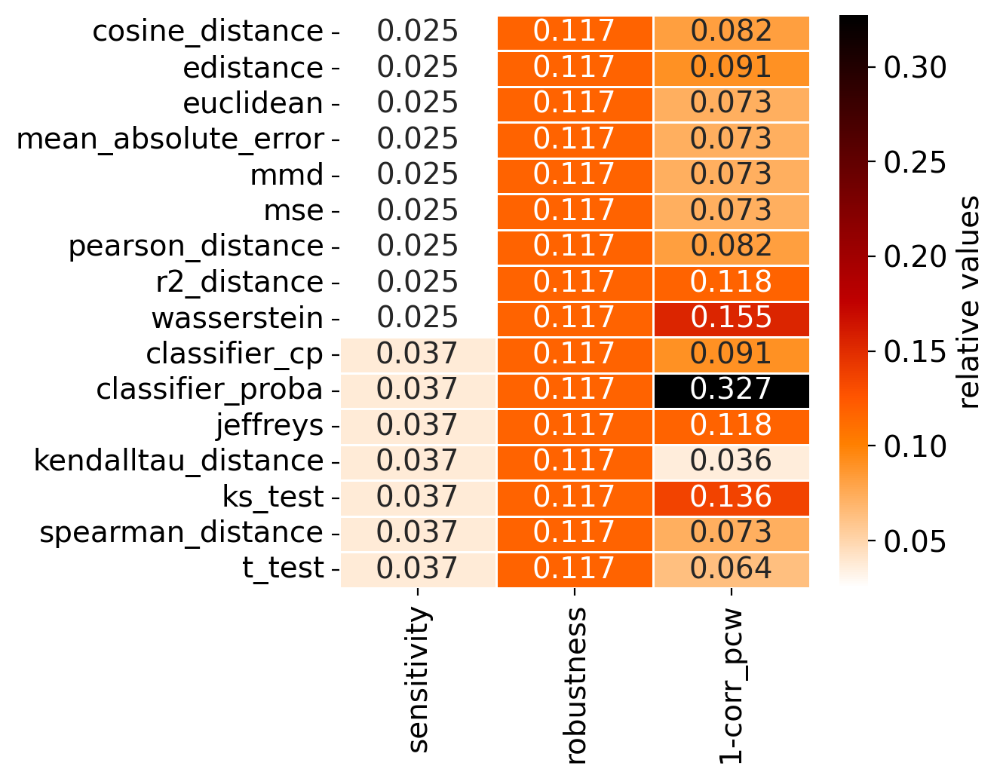

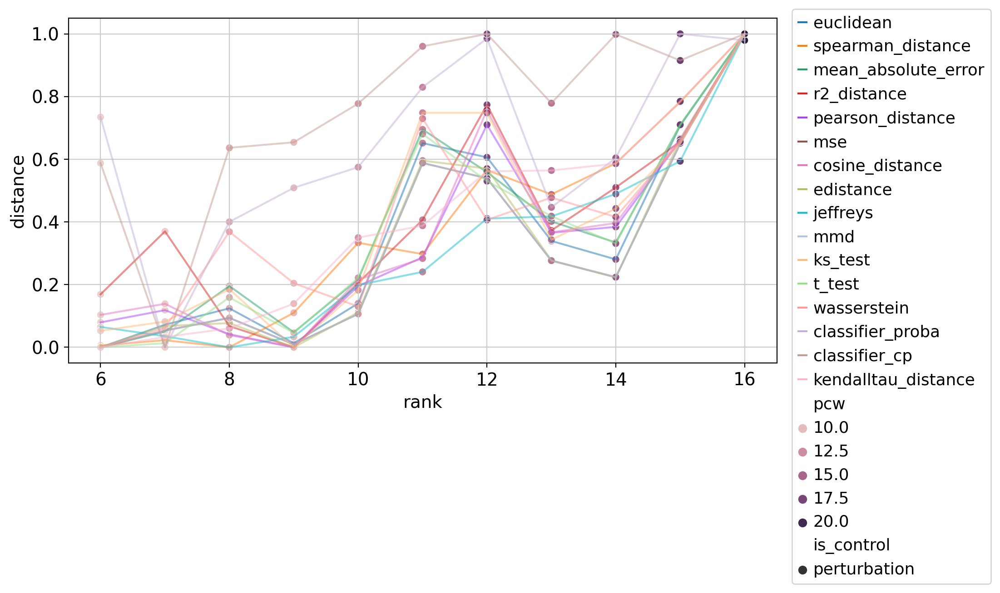

In [255]:
performances['garcia'] = evaluate_on_dataset(results, annotate, 'pcw', 'kendalltau_distance')

## schiebinger

In [256]:
%%time
with open(f'{dss_path}/schiebinger_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 80.5 ms, sys: 1.61 s, total: 1.69 s
Wall time: 1.76 s


In [257]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['day'] = [float(p[1:]) if 'D' in p else 0 for p in df.perturbation]

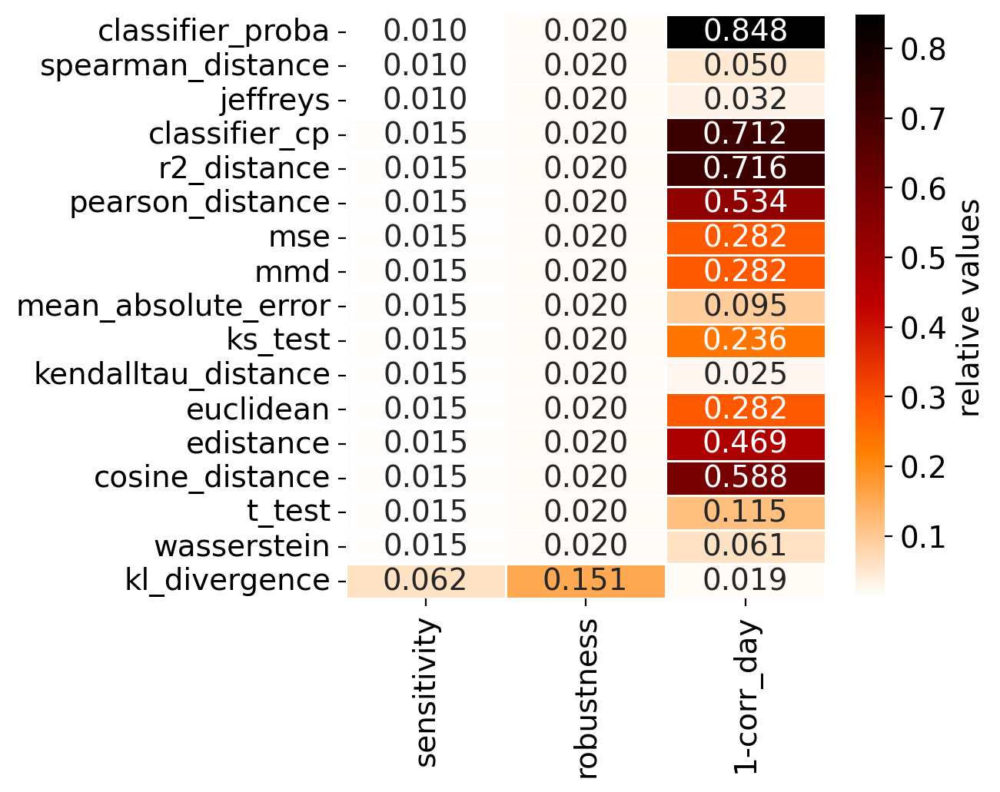

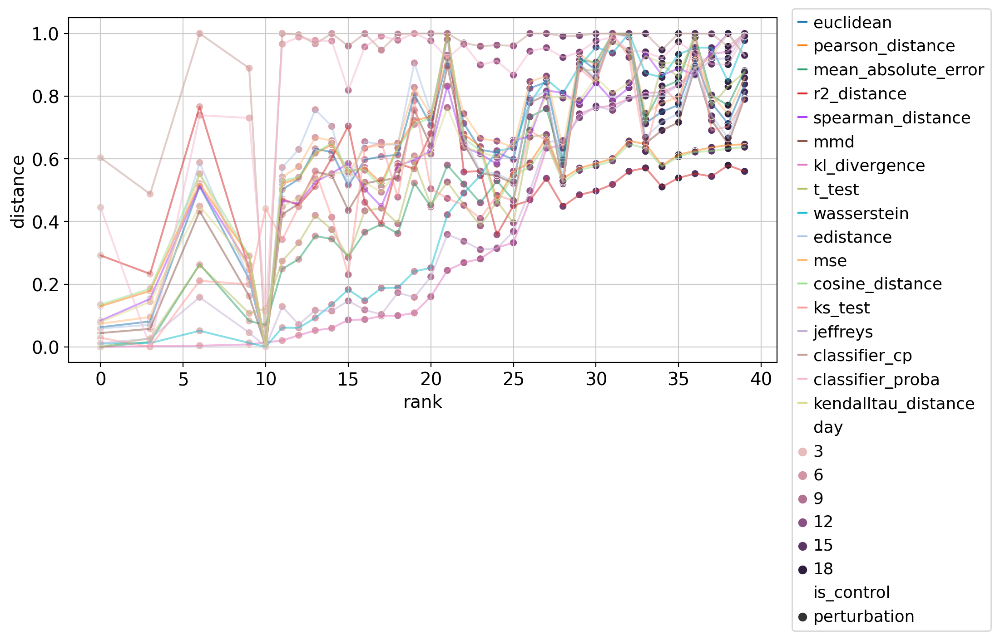

In [258]:
performances['schiebinger'] = evaluate_on_dataset(results, annotate, 'day', 'kl_divergence')

## satinha

In [259]:
%%time
with open(f'{dss_path}/satinha_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 102 ms, sys: 1.43 s, total: 1.53 s
Wall time: 1.63 s


Don't think we have a source of ground truth in this dataset...

In [260]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['n_guides'] = 1

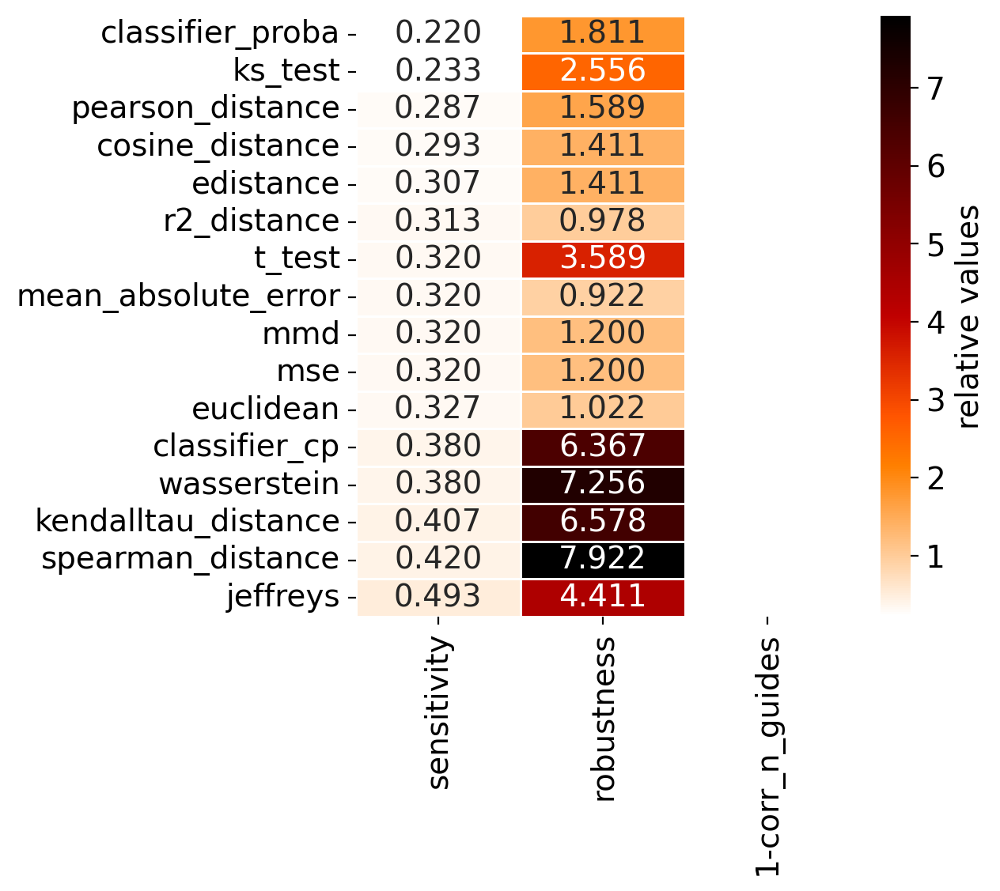

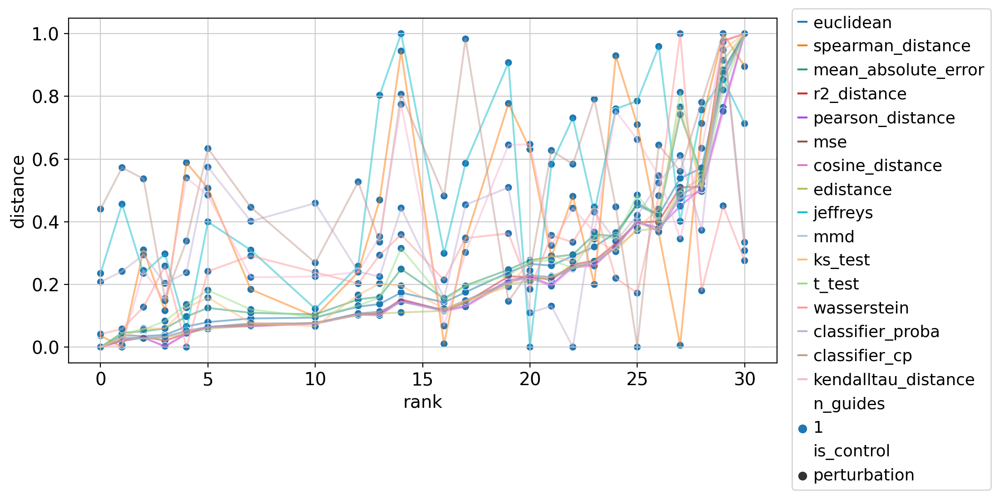

In [261]:
performances['satinha'] = evaluate_on_dataset(results, annotate, 'n_guides', 'edistance')

## norman

In [262]:
%%time
with open(f'{dss_path}/norman_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 124 ms, sys: 7.46 s, total: 7.58 s
Wall time: 7.77 s


In [263]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['n_guides'] = [int(s.count('+'))+1 for s in df.perturbation]

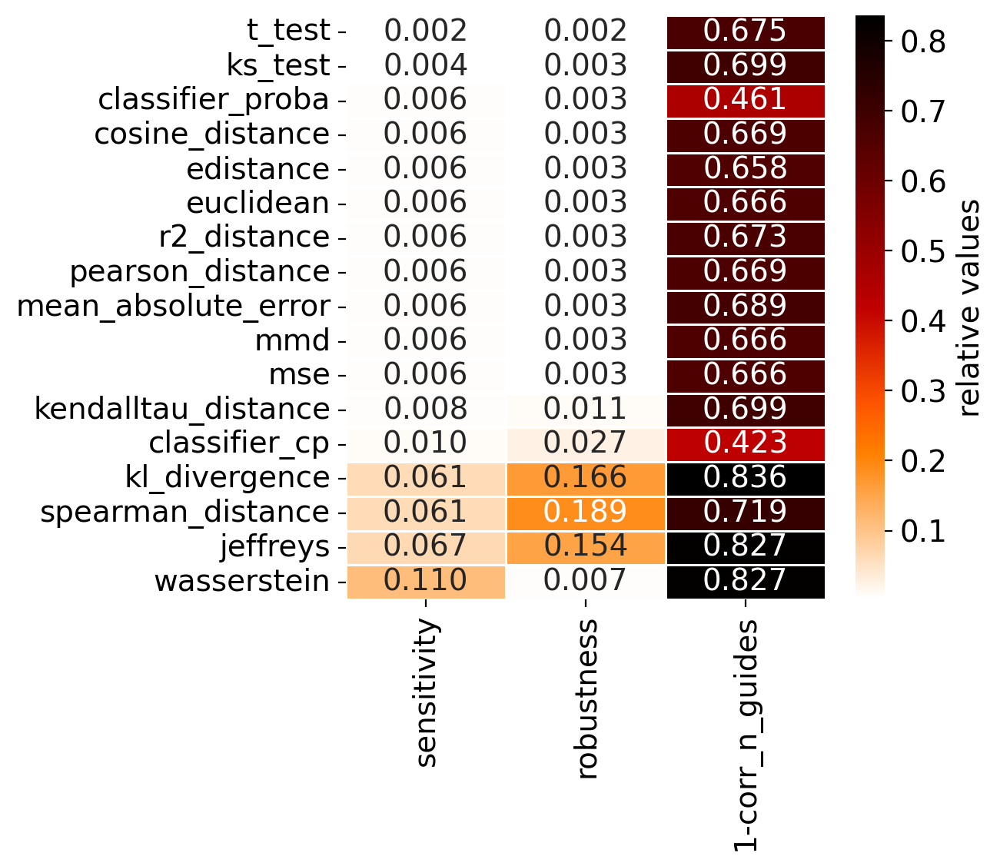

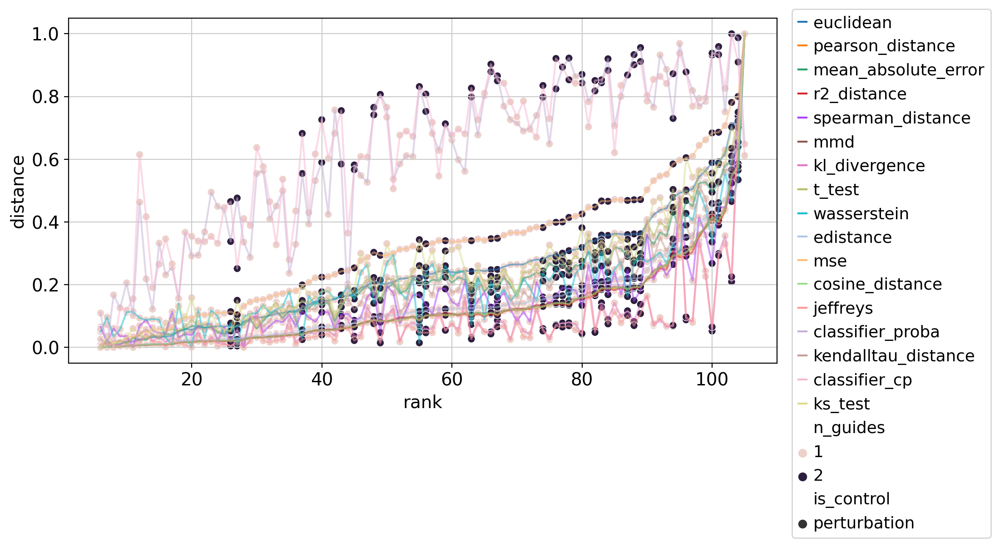

In [264]:
performances['norman'] = evaluate_on_dataset(results, annotate, 'n_guides', 'edistance')

## sciplex

In [265]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['dose'] = [0 if 'control' in x else float(x.split('_')[1]) for x in df.perturbation]
    df['log(dose)'] = [0 if 'control' in x else np.log10(float(x.split('_')[1])) for x in df.perturbation]

### MCF7

In [266]:
%%time
with open(f'{dss_path}/spMCF7_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 122 ms, sys: 4.54 s, total: 4.66 s
Wall time: 4.85 s


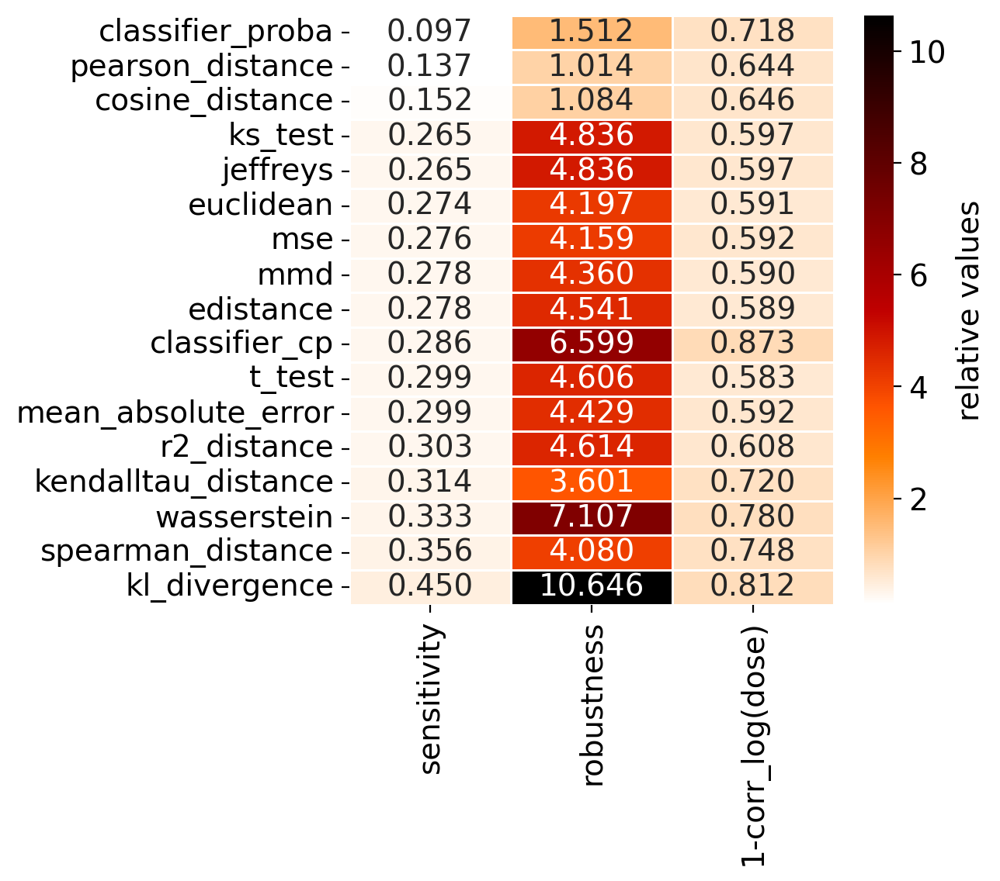

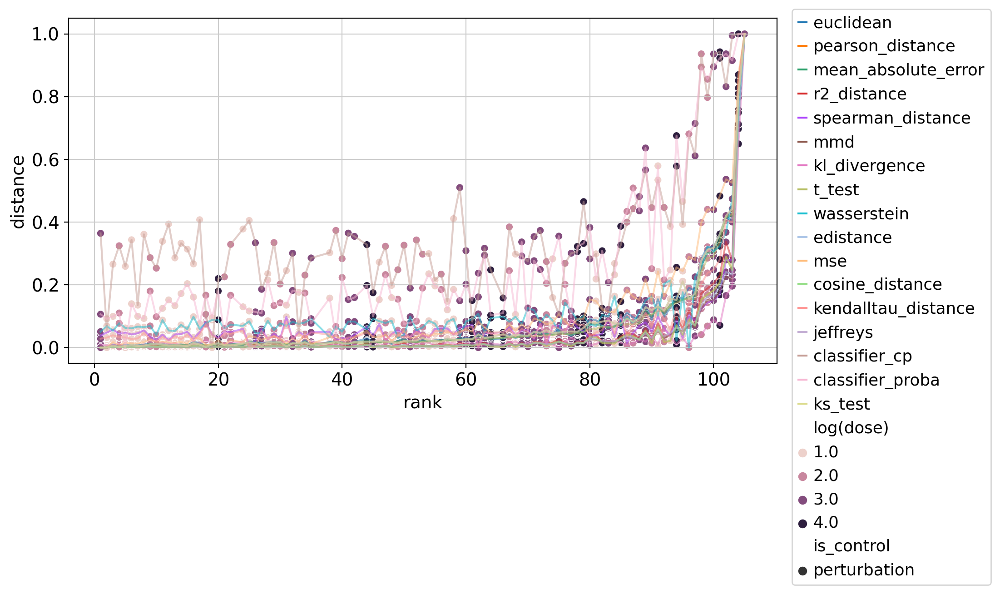

In [267]:
performances['sciplex_MCF7'] = evaluate_on_dataset(results, annotate, 'log(dose)', 't_test')

### A549

In [268]:
%%time
with open(f'{dss_path}/spA549_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 74.9 ms, sys: 1.91 s, total: 1.99 s
Wall time: 2.11 s


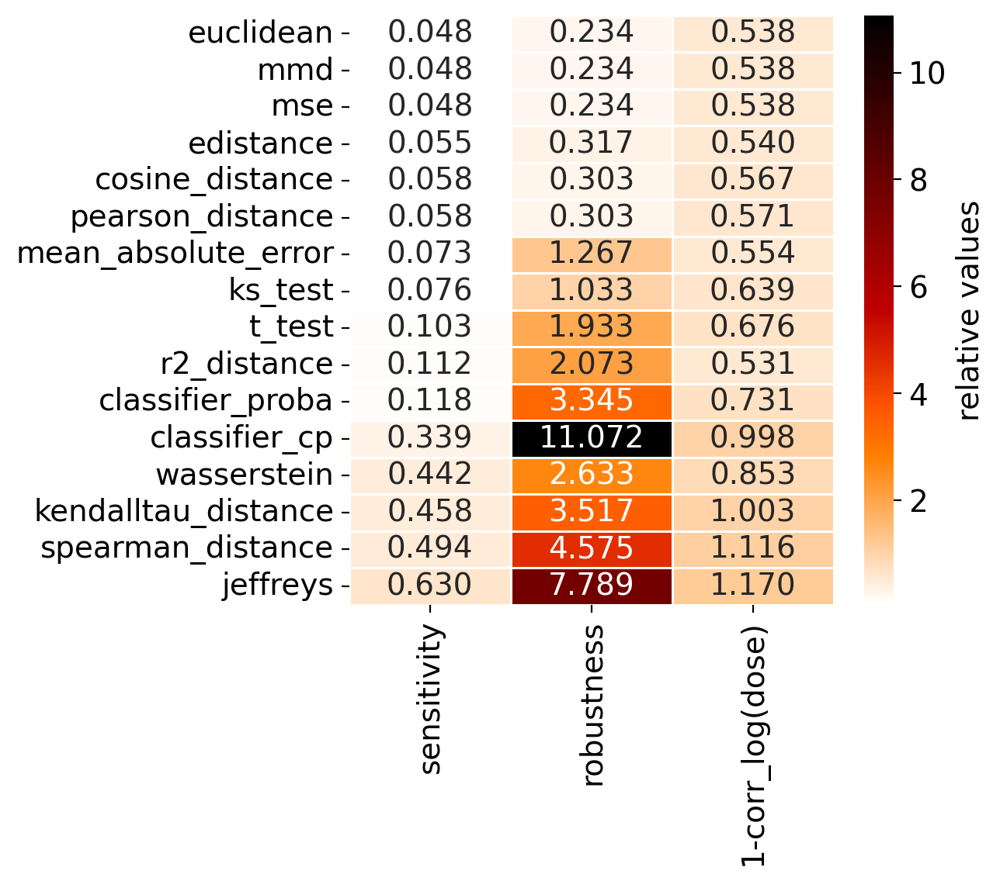

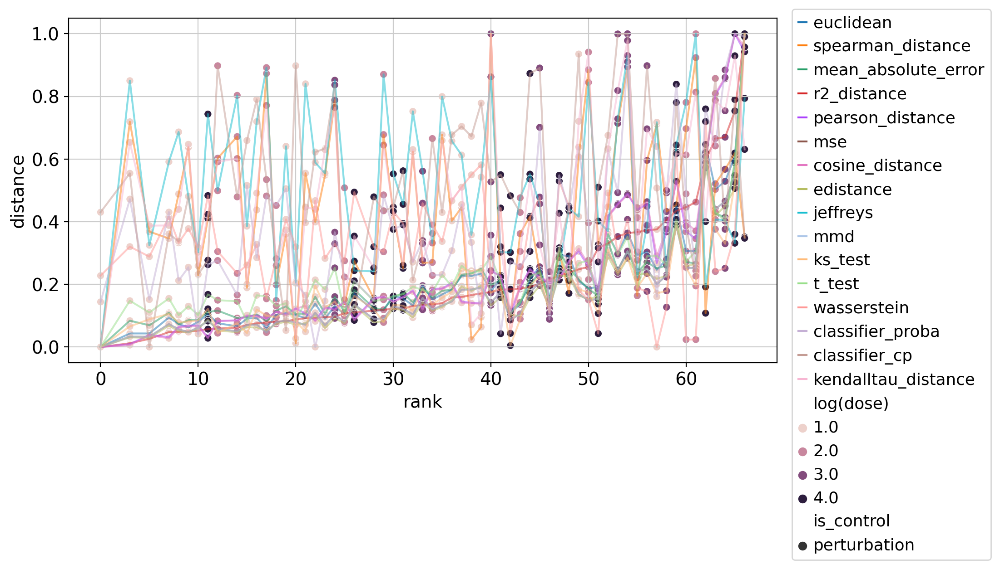

In [269]:
performances['sciplex_A549'] = evaluate_on_dataset(results, annotate, 'log(dose)', 'r2_distance')

### K562

In [270]:
%%time
with open(f'{dss_path}/spK562.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['10-lognorm-n_genes', '50-lognorm-n_genes', '100-lognorm-n_genes', '500-lognorm-n_genes', '1000-lognorm-n_genes', '2000-lognorm-n_genes', '5000-lognorm-n_genes', '100-lognorm-n_cells', '150-lognorm-n_cells', '200-lognorm-n_cells', '250-lognorm-n_cells', '270-lognorm-n_cells', '0.524-lognorm-count_mean', '0.491-lognorm-count_mean', '0.453-lognorm-count_mean', '0.415-lognorm-count_mean', '0.376-lognorm-count_mean', '0.336-lognorm-count_mean', '0.296-lognorm-count_mean', '0.256-lognorm-count_mean', '0.216-lognorm-count_mean', '10-lognorm-n_DEGs', '20-lognorm-n_DEGs', '30-lognorm-n_DEGs', '40-lognorm-n_DEGs', '50-lognorm-n_DEGs', '100-lognorm-n_DEGs', '150-lognorm-n_DEGs', '200-lognorm-n_DEGs', '300-lognorm-n_DEGs', '400-lognorm-n_DEGs', '0.490-lognorm-count_mean'])
CPU times: user 1.43 s, sys: 48.3 s, total: 49.7 s
Wall time: 50.7 s


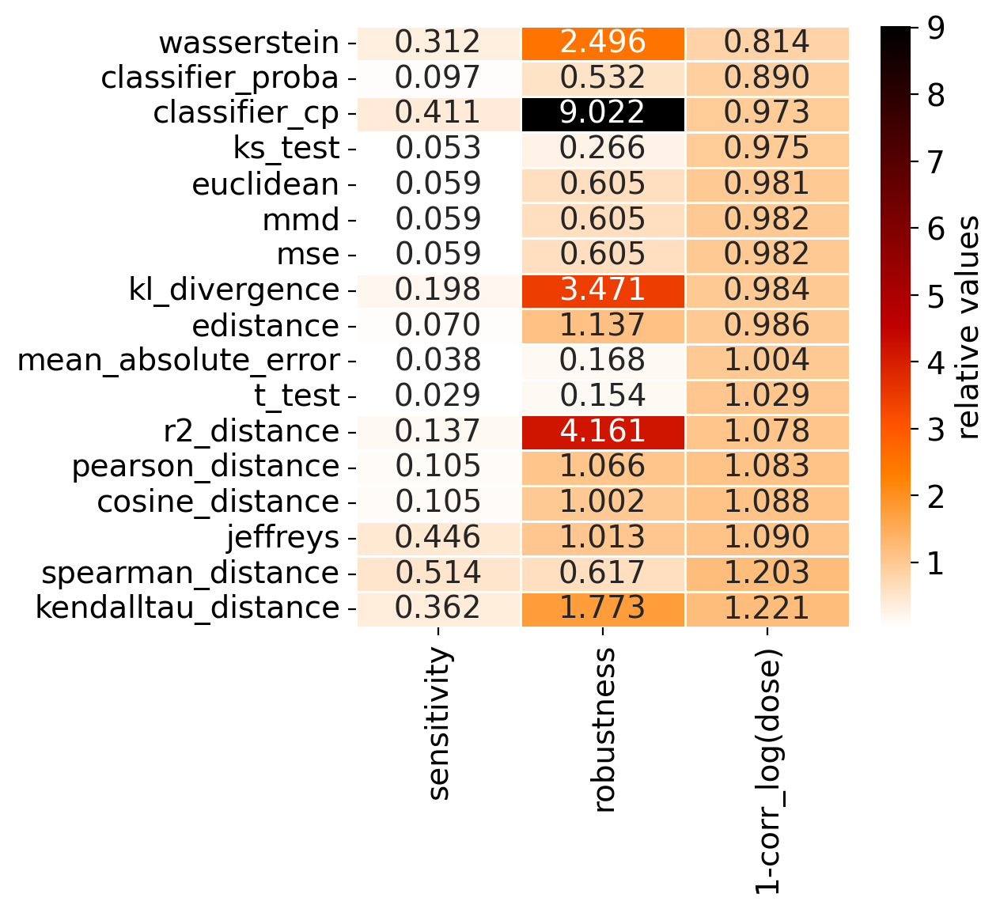

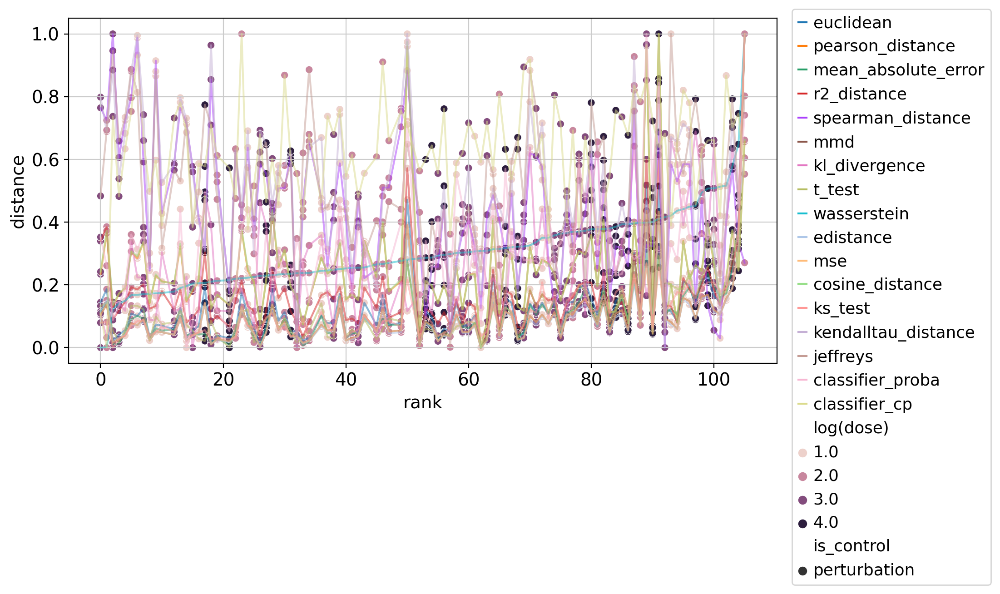

In [271]:
performances['sciplex_K562']  = evaluate_on_dataset(results, annotate, 'log(dose)', 'wasserstein')

## mcfarland

In [272]:
%%time
with open(f'{dss_path}/mcfarland_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 41.6 ms, sys: 29 ms, total: 70.6 ms
Wall time: 98.9 ms


In [273]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['time'] = [0 if 'control' in p else p.split('_')[1] for p in df.perturbation]

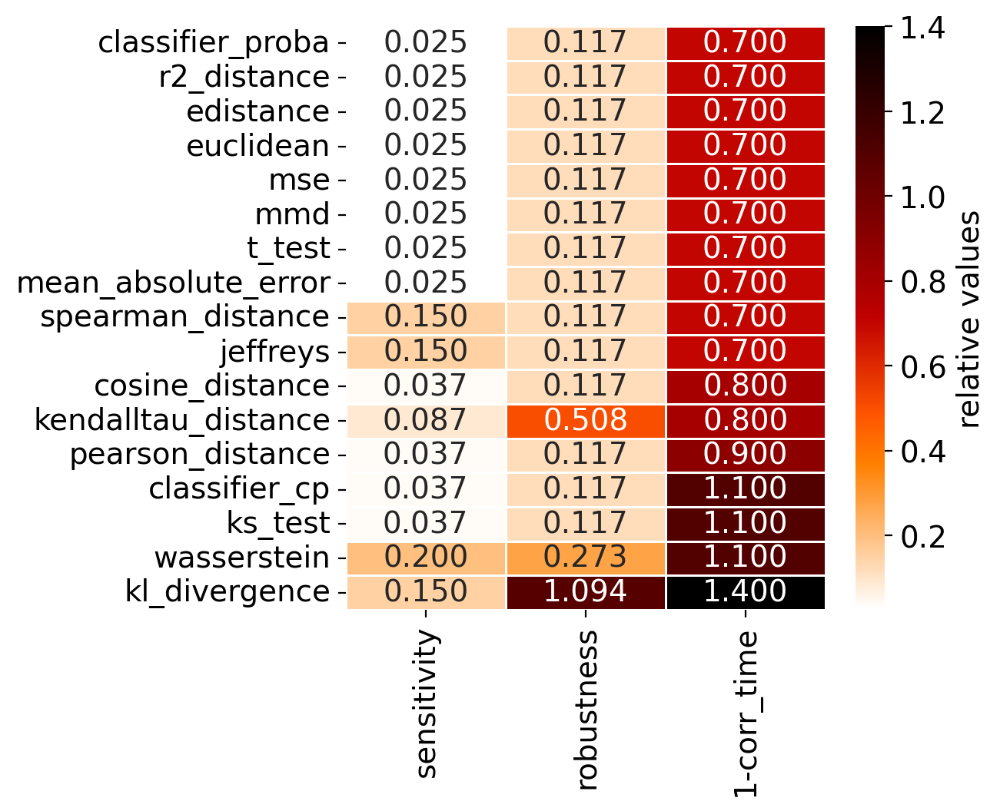

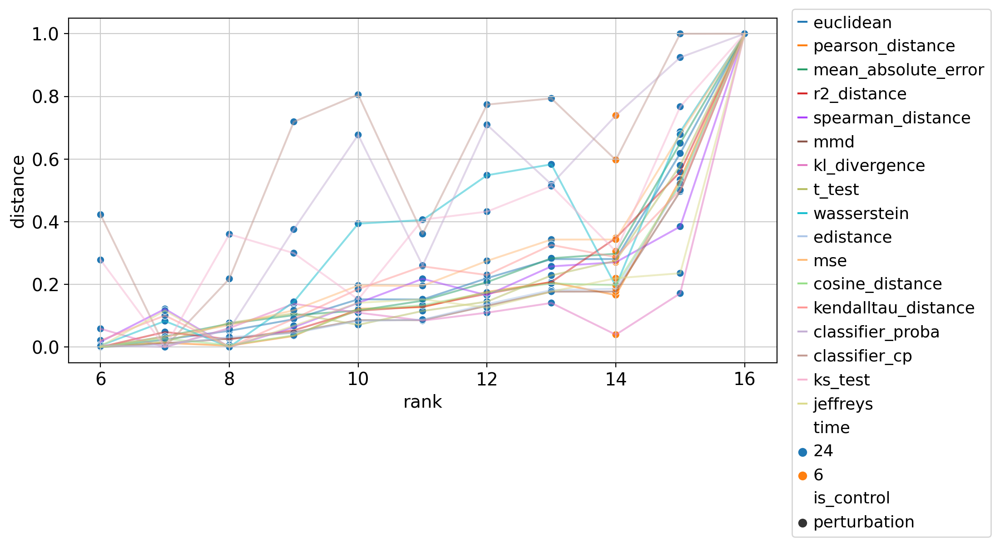

In [274]:
performances['mcfarland'] = evaluate_on_dataset(results, annotate, 'time', 'mean_absolute_error')

## simulated

In [275]:
%%time
with open('metric_runs_simulated2.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['100-pca-n_cells', '100-lognorm-n_cells', '100-counts-n_cells', '200-pca-n_cells', '200-lognorm-n_cells', '200-counts-n_cells', '300-pca-n_cells', '300-lognorm-n_cells', '300-counts-n_cells', '400-pca-n_cells', '400-lognorm-n_cells', '400-counts-n_cells', '500-pca-n_cells', '500-lognorm-n_cells', '500-counts-n_cells', '600-pca-n_cells', '600-lognorm-n_cells', '600-counts-n_cells', '10-lognorm-n_genes', '10-counts-n_genes', '10-pca-n_genes', '50-lognorm-n_genes', '50-counts-n_genes', '50-pca-n_genes', '100-lognorm-n_genes', '100-counts-n_genes', '100-pca-n_genes', '500-lognorm-n_genes', '500-counts-n_genes', '500-pca-n_genes', '1000-lognorm-n_genes', '1000-counts-n_genes', '1000-pca-n_genes', '2000-lognorm-n_genes', '2000-counts-n_genes', '2000-pca-n_genes', '5000-lognorm-n_genes', '5000-counts-n_genes', '5000-pca-n_genes', '10-lognorm-n_DEGs', '10-counts-n_DEGs', '20-lognorm-n_DEGs', '20-counts-n_DEGs', '30-lognorm-n_DEGs', '30-counts-n_DEGs', '40-lognorm-n_DEGs', '40-counts

In [276]:
# get metadata
params = pd.read_csv('../splatter_sim_params.csv').reset_index()
params['perturbation'] = [f'Path{x}' for x in params['index'].values]
params.perturbation.replace({'Path1': 'control'}, inplace=True)

def annotate(df):
    # annotate
    for col in params.columns:
        df[col] = df['perturbation'].map(dict(zip(params.perturbation, params[col])))
    df = df.dropna()  # dropping fake controls

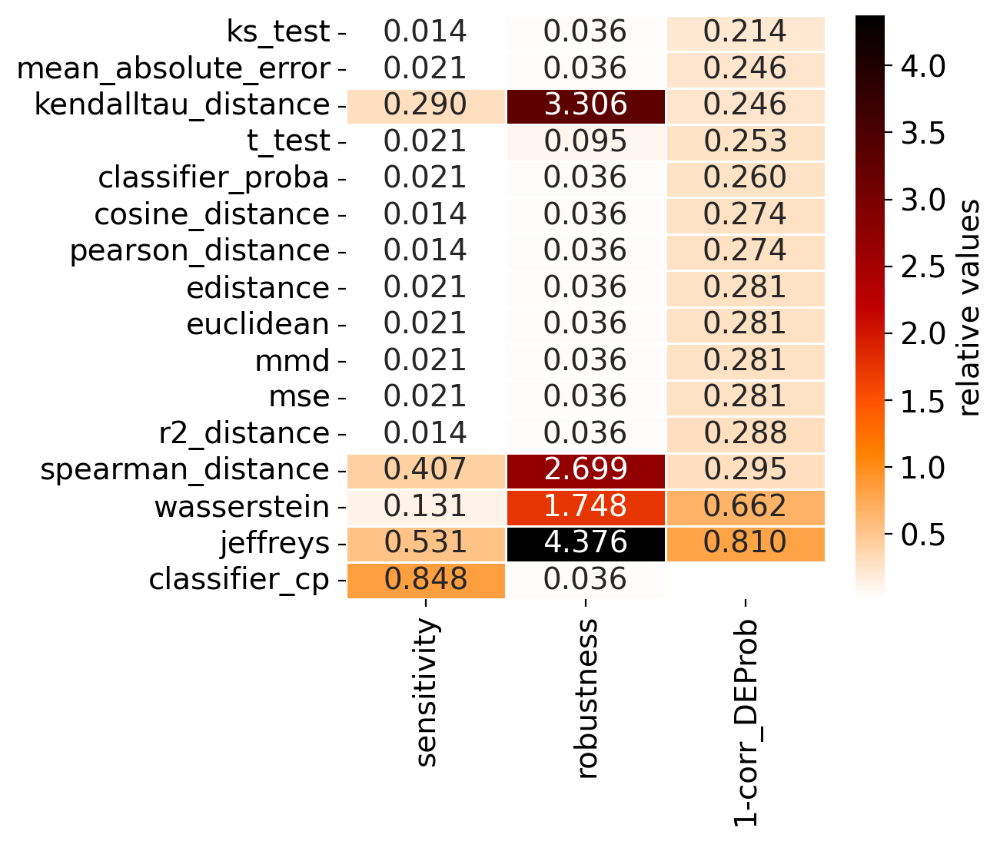

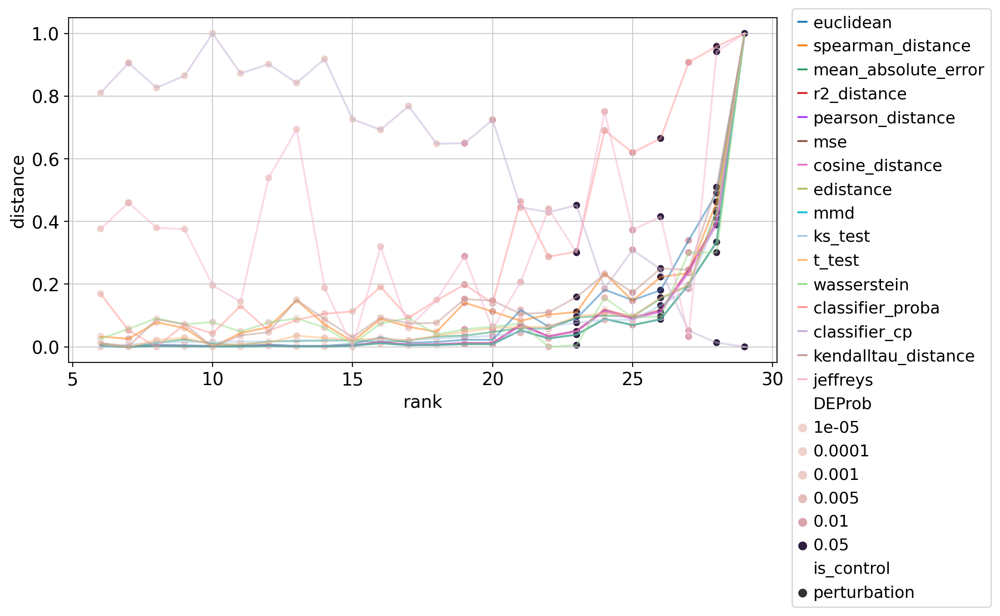

In [277]:
performances['simulated'] = evaluate_on_dataset(results, annotate, 'DEProb', 'ks_test')

## summary

In [278]:
dfs = []
for k, df in performances.items():
    sdf = df.add_suffix(f'_{k}')
    dfs.append(sdf)

In [279]:
df = pd.concat(dfs, axis=1)

Remove KL divergence because it's been replaced with symmetric KL. Also drop any columns that are completely empty because evaluation wasn't possible.

In [280]:
df = df.drop(['kl_divergence'], axis=0).dropna(axis=1, how='all')

Rename the distance metrics for consistency with publication.

In [281]:
df.index = [' '.join(x.split('_')) for x in df.index]
df = df.rename({
    'euclidean':'Euclidean',
    'mse':'MSE',
    'mmd':'MMD',
    'edistance':'E-distance',
    'pearson distance': 'Pearson',
    't test': 'T-test',
    'r2 distance': 'R2',
    'ks test': 'KS statistic',
    'kendalltau distance': 'Kendall tau distance',
    'spearman distance': 'Spearman',
    'classifier cp': 'classifier class projection',
    'wasserstein':'Wasserstein',
    'jeffreys':'symmetric KL div.'
})

Many of the plots will use scaled values. Also calculate the final ranking using the avg.

In [282]:
ndf = df.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=0)
ndf = ndf.loc[ndf.mean(axis=1).sort_values().index]
ndf.mean(axis=1).sort_values()

mean absolute error            0.206448
Euclidean                      0.206648
MSE                            0.206964
MMD                            0.208248
cosine distance                0.219138
Pearson                        0.223372
E-distance                     0.223406
classifier proba               0.230143
T-test                         0.232218
R2                             0.281862
KS statistic                   0.297453
Kendall tau distance           0.475727
Spearman                       0.510030
Wasserstein                    0.519119
symmetric KL div.              0.545673
classifier class projection    0.548703
dtype: float64

Standardize the order of the dataframe and save.

In [283]:
df = df.loc[ndf.mean(axis=1).sort_values().index]
df.to_csv('results_table.csv')

Plot absolute values.

<Figure size 2400x600 with 0 Axes>

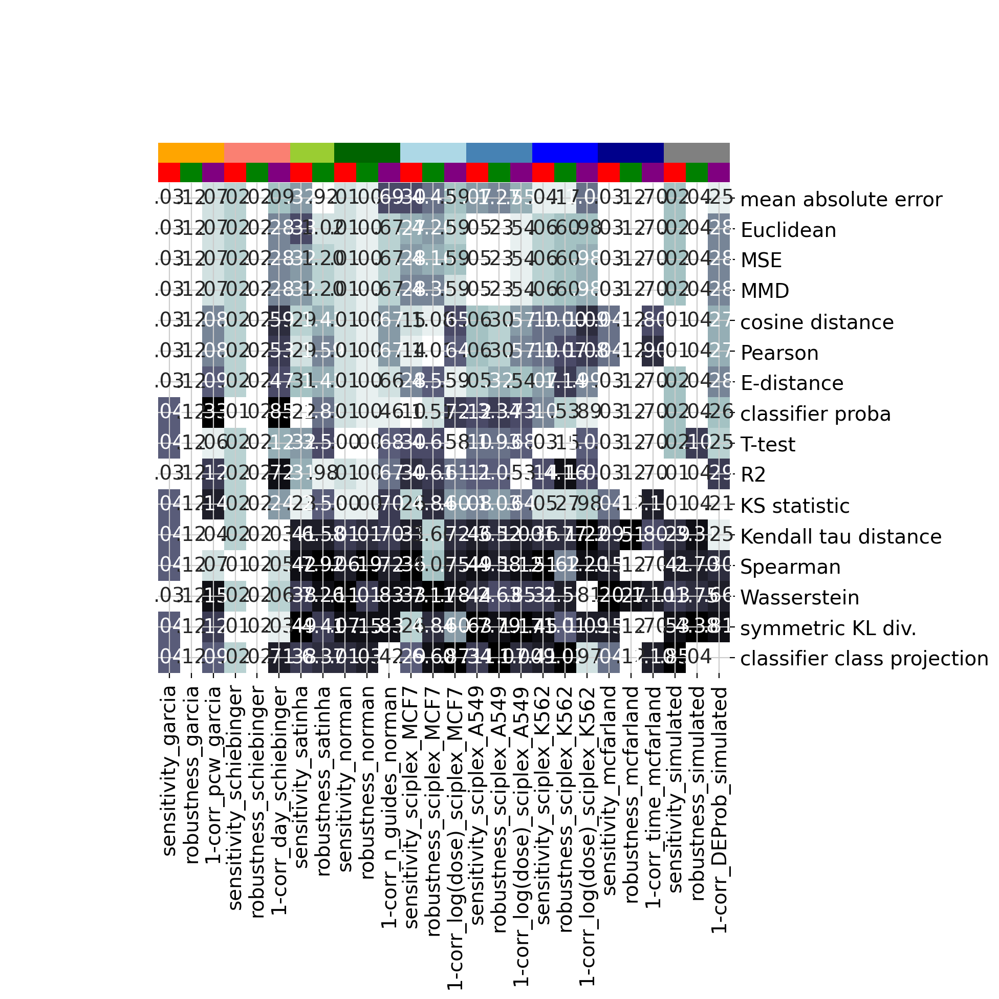

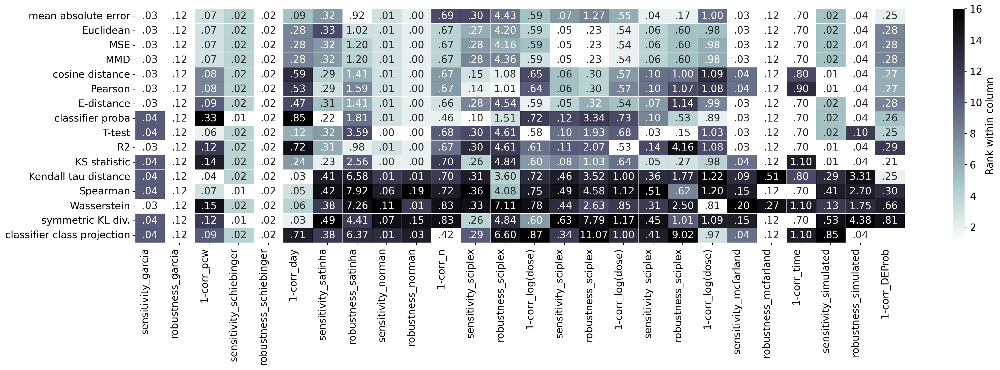

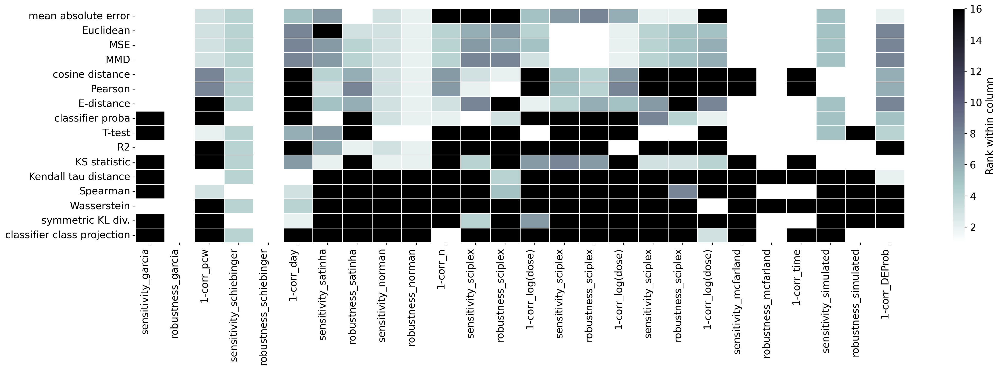

In [334]:
color_dict = {
    'garcia':'orange',
    'schiebinger':'salmon',
    'satinha':'yellowgreen',
    'norman':'darkgreen',
    'MCF7':'lightblue',
    'A549':'steelblue',
    'K562':'blue',
    'mcfarland':'darkblue',
    'simulated':'grey'
}

def plot(df):
    plot_df = df.copy()
    
    plt.figure(figsize=(24, 6))
    # just for the col color
    col_color_dataset = [color_dict[c.split('_')[-1]] for c in df.columns]
    col_color_task = ['r', 'g', 'purple']*2 + ['r', 'g'] + ['r', 'g', 'purple']*6
    sns.clustermap(
        plot_df.round(3).rank(method='min'),
        annot=plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".")),
        cmap='bone_r', fmt = '', cbar_kws={'label': 'Rank within column'},
        row_cluster=False, col_cluster=False, col_colors=[col_color_dataset, col_color_task],
        cbar_pos=None
    )
    
    plot_df.columns = ['_'.join(c.split('_')[:2]) for c in plot_df.columns]
    plot_df = plot_df.rename(columns={'rank_mean':'1-sensitivity', 'rank_var*100':'1-robustness'})
    plt.figure(figsize=(24, 6))
    sns.heatmap(
        plot_df.round(3).rank(method='min'),
        annot=plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".")),
        cmap='bone_r', linewidths=.2, fmt = '', cbar_kws={'label': 'Rank within column'}
    )
    plt.xticks(rotation=90, ha='right')
    plt.grid(None)
    plt.show()
    
    # for the plot showing that MSe performs above average in all datasets
    halfway = 9
    plot_df = plot_df.round(3).rank(method='min').clip(upper=halfway)
    plt.figure(figsize=(24, 6))
    sns.heatmap(
        plot_df.replace(halfway, 16),
#         annot=plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".")),
        cmap='bone_r', linewidths=.5, #fmt = '', 
        cbar_kws={'label': 'Rank within column'}
    )
    plt.xticks(rotation=90, ha='right')
    plt.grid(None)
    plt.show()

plot(df)

In [299]:
def plot_sub(sub_df, cmap, is_spearman=False):
    sub_df.columns = [c.split('_')[-1] for c in sub_df.columns]
    annot_df = sub_df.fillna(0)
    if is_spearman:
        annot_df = 1 - annot_df
    annot_df = annot_df.applymap(lambda x: "{:.2f}".format(x).replace("0.", "."))

    
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        sub_df.round(3).rank(method='min'),
        annot=annot_df,
        cmap=cmap, linewidths=.5, fmt = '', cbar_kws={'label': 'Rank within column'}
    )
    plt.xticks(rotation=30, ha='right')
    plt.grid(None)
    
    print(sub_df.mean(axis=1).sort_values())
    return sub_df

classifier proba               0.144924
Pearson                        0.186369
cosine distance                0.195615
E-distance                     0.239516
MSE                            0.240347
MMD                            0.241164
Euclidean                      0.242241
mean absolute error            0.249988
R2                             0.278175
KS statistic                   0.320296
T-test                         0.360809
Kendall tau distance           0.627879
classifier class projection    0.638127
Wasserstein                    0.655447
Spearman                       0.691839
symmetric KL div.              0.715166
dtype: float64


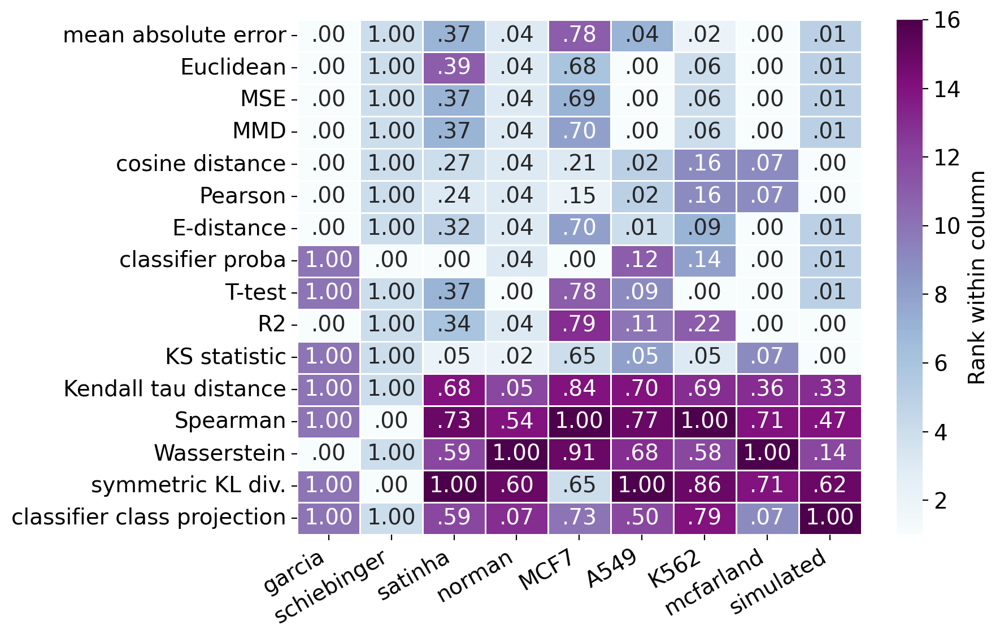

In [302]:
cols = [c for c in ndf.columns if 'sensitivity' in c]
sub_df = plot_sub(ndf[cols], 'BuPu')

T-test                         0.126772
cosine distance                0.132016
Pearson                        0.134360
classifier proba               0.171471
Euclidean                      0.176931
MSE                            0.179058
MMD                            0.182730
mean absolute error            0.184692
E-distance                     0.196897
KS statistic                   0.216872
R2                             0.247247
Wasserstein                    0.357094
Kendall tau distance           0.391108
Spearman                       0.396624
symmetric KL div.              0.415030
classifier class projection    0.425592
dtype: float64


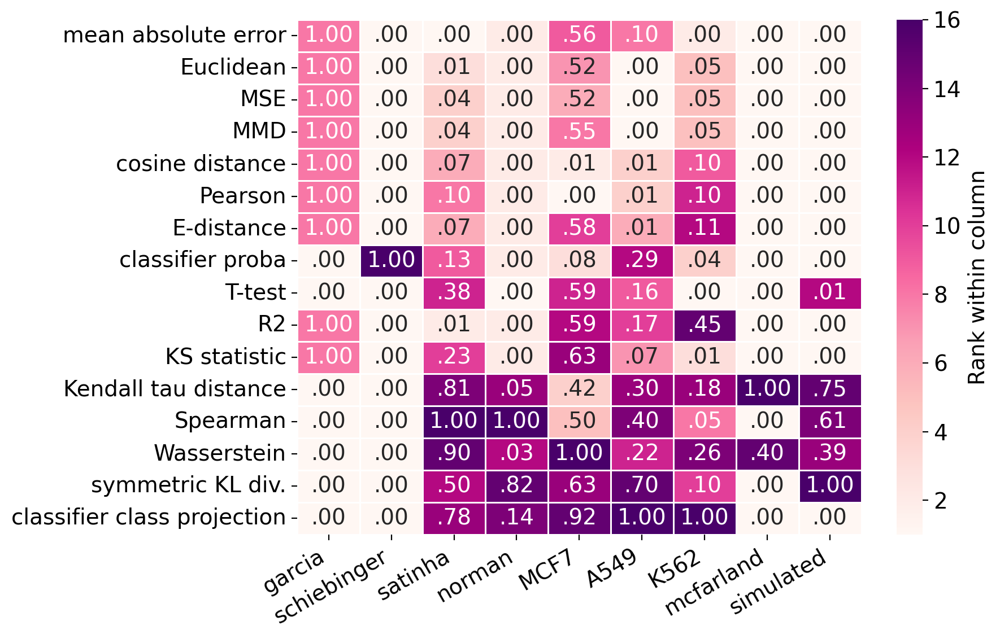

In [303]:
cols = [c for c in ndf.columns if 'robustness' in c]
sub_df = plot_sub(ndf[cols], 'RdPu')

mean absolute error            0.181941
MMD                            0.199923
Euclidean                      0.200038
MSE                            0.200802
T-test                         0.206181
E-distance                     0.235105
R2                             0.324953
cosine distance                0.343615
KS statistic                   0.362410
Pearson                        0.365139
classifier proba               0.392019
Kendall tau distance           0.399751
Spearman                       0.433078
symmetric KL div.              0.501967
Wasserstein                    0.548027
classifier class projection    0.592015
dtype: float64


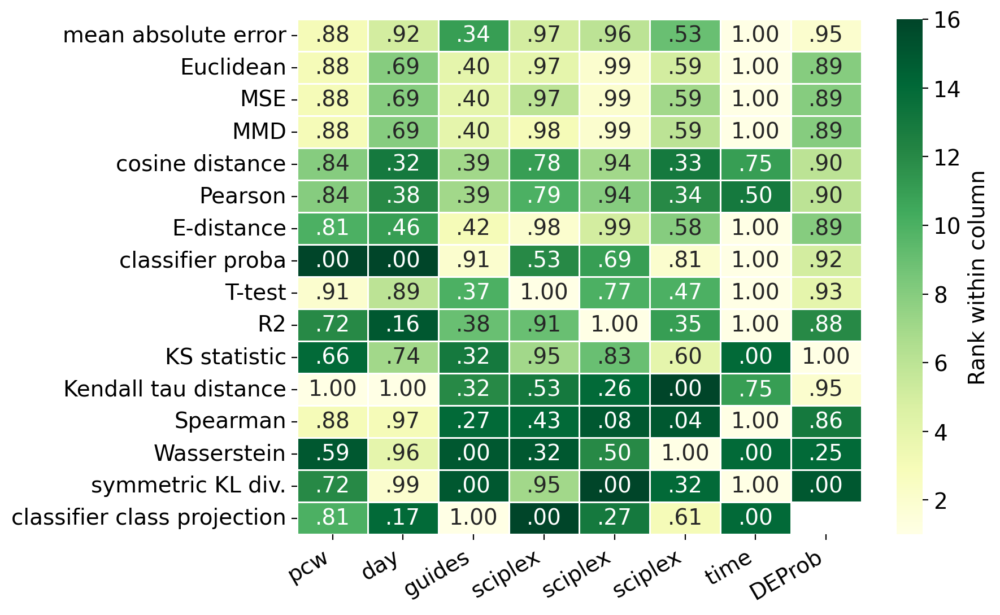

In [306]:
cols = [c for c in ndf.columns if 'sens' not in c and 'robu' not in c]
sub = ndf[cols]
sub.columns = ['_'.join(c.split('_')[:-1]) for c in sub.columns]
sub_df = plot_sub(sub, 'YlGn', is_spearman=True)